# TP3 - Clasificación de emociones con CNN

## 0. Librerías y configuración

In [1]:
import os
import random
import zipfile
from pathlib import Path
import copy

import gdown
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import v2

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

## 1. Preprocesamiento de datos

### 1.1 Descarga del dataset

In [3]:
BASE_DATA_DIR = Path.home() / "tp3_emociones"
DATA_DIR = BASE_DATA_DIR / "datos_zip"

DATASET_ROOT_TRAIN = (
    DATA_DIR / "dataset_emociones" / "train"
)

DATASET_ROOT_VAL = (
    DATA_DIR / "dataset_emociones" / "validation"
)

if not DATASET_ROOT_TRAIN.exists() or not DATASET_ROOT_VAL.exists():

    BASE_DATA_DIR.mkdir(
        parents=True,
        exist_ok=True
    )

    url = (
        "https://drive.google.com/uc?"
        "id=1aPHE00zkDhEV1waJKhaOJMdN6-lUc0iT"
    )

    zip_path = BASE_DATA_DIR / "archivo.zip"

    print("Descargando dataset...")
    gdown.download(
        url,
        str(zip_path),
        quiet=False
    )

    DATA_DIR.mkdir(
        parents=True,
        exist_ok=True
    )

    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(DATA_DIR)

else:
    print("Dataset ya disponible.")

print("Train:", DATASET_ROOT_TRAIN)
print("Validation:", DATASET_ROOT_VAL)

Dataset ya disponible.
Train: C:\Users\tolot\tp3_emociones\datos_zip\dataset_emociones\train
Validation: C:\Users\tolot\tp3_emociones\datos_zip\dataset_emociones\validation


### 1.2 Distribución de las clases

,Train,Validation
alegria,4772,1185
disgusto,717,160
enojo,705,162
miedo,281,74
seriedad,2524,680
sorpresa,1290,329
tristeza,1982,478


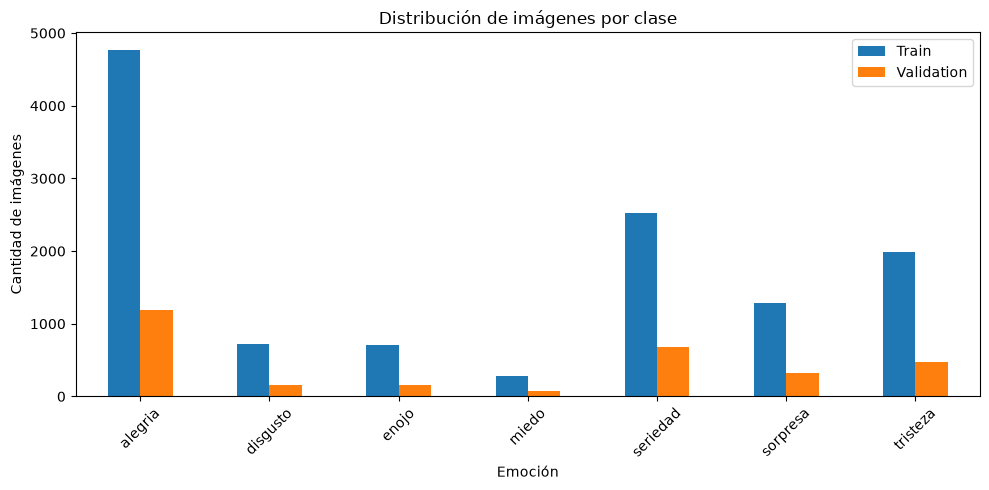

In [ ]:
def contar_imagenes(root):
    conteo = {}

    for clase in sorted(os.listdir(root)):
        clase_path = Path(root) / clase

        if clase_path.is_dir():
            conteo[clase] = sum(
                f.is_file()
                for f in clase_path.iterdir()
            )

    return conteo


train_counts = contar_imagenes(
    DATASET_ROOT_TRAIN
)

val_counts = contar_imagenes(
    DATASET_ROOT_VAL
)

df_counts = pd.DataFrame({
    "Train": pd.Series(train_counts),
    "Validation": pd.Series(val_counts)
})

display(df_counts)

df_counts.plot(
    kind="bar",
    figsize=(10, 5)
)

plt.title(
    "Distribución de imágenes por clase"
)
plt.xlabel("Emoción")
plt.ylabel("Cantidad de imágenes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

El dataset presenta un desbalance importante entre las clases. En lugar de eliminar ejemplos o duplicar manualmente imágenes, se compensará el desbalance mediante pesos en la función de costo.

### 1.3 Visualización de ejemplos

Clases: ['alegria', 'disgusto', 'enojo', 'miedo', 'seriedad', 'sorpresa', 'tristeza']
Mapeo: {'alegria': 0, 'disgusto': 1, 'enojo': 2, 'miedo': 3, 'seriedad': 4, 'sorpresa': 5, 'tristeza': 6}


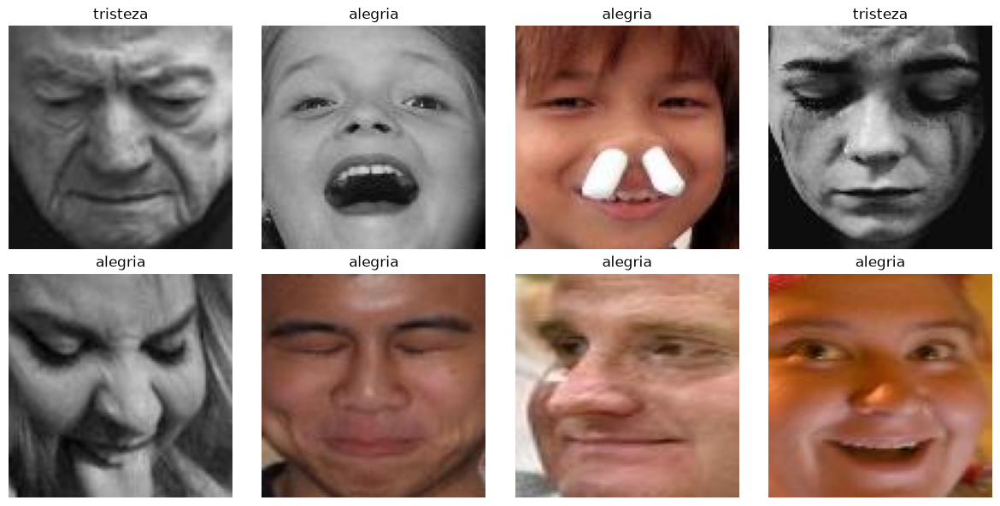

In [5]:
dataset_original = datasets.ImageFolder(
    DATASET_ROOT_TRAIN
)

print("Clases:", dataset_original.classes)
print("Mapeo:", dataset_original.class_to_idx)

fig, axes = plt.subplots(
    2, 4,
    figsize=(12, 6)
)

for ax in axes.flat:
    idx = random.randint(
        0,
        len(dataset_original) - 1
    )

    image, label = dataset_original[idx]

    ax.imshow(image, cmap="gray")
    ax.set_title(
        dataset_original.classes[label]
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

### 1.4 Transformaciones

Se conserva la resolución de **100 × 100** y se utiliza escala de grises.

Para entrenamiento se utiliza `TrivialAugmentWide`, que genera automáticamente una transformación aleatoria moderada por imagen. Esto permite introducir mayor variedad durante entrenamiento sin diseñar manualmente una larga lista de transformaciones.

La validación no contiene transformaciones aleatorias.

In [6]:
IMG_SIZE = 100

train_transform = v2.Compose([
    v2.Resize((IMG_SIZE, IMG_SIZE)),
    v2.Grayscale(num_output_channels=1),
    v2.TrivialAugmentWide(),
    v2.ToImage(),
    v2.ToDtype(
        torch.float32,
        scale=True
    ),
    v2.Normalize(
        mean=[0.5],
        std=[0.5]
    )
])

val_transform = v2.Compose([
    v2.Resize((IMG_SIZE, IMG_SIZE)),
    v2.Grayscale(num_output_channels=1),
    v2.ToImage(),
    v2.ToDtype(
        torch.float32,
        scale=True
    ),
    v2.Normalize(
        mean=[0.5],
        std=[0.5]
    )
])

### 1.5 Datasets y DataLoaders

In [7]:
train_dataset = datasets.ImageFolder(
    DATASET_ROOT_TRAIN,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    DATASET_ROOT_VAL,
    transform=val_transform
)

BATCH_SIZE = 64

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

class_names = train_dataset.classes
num_classes = len(class_names)

print("Clases:", class_names)
print("Train:", len(train_dataset))
print("Validation:", len(val_dataset))

Clases: ['alegria', 'disgusto', 'enojo', 'miedo', 'seriedad', 'sorpresa', 'tristeza']
Train: 12271
Validation: 3068


## 2. Construcción y entrenamiento de la CNN

### 2.1 Arquitectura

Se utilizan cuatro bloques convolucionales. Los primeros niveles detectan patrones visuales simples y los bloques más profundos combinan esas características en representaciones más abstractas.

El primer kernel es de 5 × 5 y los siguientes de 3 × 3.

Se utiliza GELU como activación y Dropout2d en los bloques profundos para reducir el sobreajuste.

Finalmente, Global Average Pooling reduce cada mapa de características a un único valor antes de las capas fully connected.

In [ ]:
def conv_block(
    ch_in,
    ch_out,
    kernel_size=3
):
    return nn.Sequential(
        nn.Conv2d(
            ch_in,
            ch_out,
            kernel_size,
            padding="same"
        ),
        nn.GELU(),
        nn.MaxPool2d(2)
    )


class EmotionCNN(nn.Module):

    def __init__(self, num_classes=7, dropout=0.2
    ):
        super().__init__()

        self.conv1 = conv_block(1, 32, 5)

        self.conv2 = conv_block(32, 64, 3)

        self.conv3 = conv_block(64, 128, 3)

        self.conv4 = conv_block(128, 248, 3)

        self.drop_conv = nn.Dropout2d(dropout)

        self.global_pool = (
            nn.AdaptiveAvgPool2d((1, 1))
        )

        self.fc1 = nn.Linear(248, 128)

        self.drop_fc = nn.Dropout(dropout)

        self.fc2 = nn.Linear(128,num_classes)

    def forward(self, x):

        x = self.conv1(x)
        x = self.conv2(x)

        x = self.conv3(x)
        x = self.drop_conv(x)

        x = self.conv4(x)
        x = self.drop_conv(x)

        x = self.global_pool(x)

        x = torch.flatten(x, 1)

        x = F.gelu(self.fc1(x))

        x = self.drop_fc(x)

        return self.fc2(x)


model = EmotionCNN(num_classes=num_classes).to(device)

print(model)

total_params = sum(
    p.numel()
    for p in model.parameters()
)

print(
    f"Parámetros entrenables: "
    f"{total_params:,}"
)

EmotionCNN(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=same)
    (1): GELU(approximate='none')
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): GELU(approximate='none')
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): GELU(approximate='none')
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv4): Sequential(
    (0): Conv2d(128, 248, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): GELU(approximate='none')
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (drop_conv): Dropout2d(p=0.2, inplace=False)
  (global_pool): AdaptiveAvgPool2d(output_size=(1, 1))
  (fc1): Lin

### 2.2 Función de costo y optimizador

In [ ]:
targets = np.array(train_dataset.targets)

class_counts = np.bincount(targets)

class_weights = (
    len(targets)
    / (len(class_counts) * class_counts)
)

class_weights = torch.tensor(
    class_weights,
    dtype=torch.float32,
    device=device
)

print("Pesos por clase:")

for clase, count, weight in zip(
    class_names,
    class_counts,
    class_weights.cpu().numpy()
):
    print(
        f"{clase:12s} "
        f"n={count:4d} "
        f"peso={weight:.3f}"
    )

criterion = nn.CrossEntropyLoss(weight=class_weights)

optimizer = optim.Adam(model.parameters(), lr=1e-3)

Pesos por clase:
alegria      n=4772 peso=0.367
disgusto     n= 717 peso=2.445
enojo        n= 705 peso=2.487
miedo        n= 281 peso=6.238
seriedad     n=2524 peso=0.695
sorpresa     n=1290 peso=1.359
tristeza     n=1982 peso=0.884


### 2.3 Función de evaluación

In [ ]:
def evaluar(model, loader):

    model.eval()

    running_loss = 0.0

    all_labels = []
    all_preds = []

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(outputs, labels)

            running_loss += (loss.item() * images.size(0))

            preds = outputs.argmax(dim=1)

            all_labels.extend(labels.cpu().numpy())

            all_preds.extend(preds.cpu().numpy())

    avg_loss = (
        running_loss
        / len(loader.dataset)
    )

    accuracy = accuracy_score(all_labels, all_preds)

    f1 = f1_score(all_labels, all_preds, average="macro")

    return (
        avg_loss,
        accuracy,
        f1,
        all_labels,
        all_preds
    )

### 2.4 Entrenamiento con checkpoint y early stopping

Se fija un máximo de 100 épocas para mantener el entrenamiento acotado.

El early stopping controla el loss de validación. Si no mejora durante 30 épocas consecutivas, se detiene el entrenamiento.

El checkpoint permite continuar desde la última época si se reinicia el kernel.

In [ ]:
MAX_EPOCHS = 100
PATIENCE = 30
MIN_DELTA = 1e-4

SAVE_DIR = (
    Path.home()
    / "tp3_emociones"
)

SAVE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

CHECKPOINT_PATH = (
    SAVE_DIR
    / "checkpoint_emociones_v4.pth"
)

BEST_MODEL_PATH = (
    SAVE_DIR
    / "best_model_emociones_v4.pth"
)

history = {
    "epoch": [],
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
    "train_f1": [],
    "val_f1": []
}

start_epoch = 0
best_val_loss = float("inf")
patience_counter = 0


# Recuperar entrenamiento previo
if CHECKPOINT_PATH.exists():

    checkpoint = torch.load(
        CHECKPOINT_PATH,
        map_location=device,
        weights_only=False
    )

    model.load_state_dict(
        checkpoint["model_state_dict"]
    )

    optimizer.load_state_dict(
        checkpoint["optimizer_state_dict"]
    )

    history = checkpoint["history"]

    start_epoch = checkpoint["epoch"]

    best_val_loss = checkpoint[
        "best_val_loss"
    ]

    patience_counter = checkpoint[
        "patience_counter"
    ]

    print(
        f"Checkpoint recuperado "
        f"hasta época {start_epoch}."
    )

else:
    print(
        "No existe checkpoint V4. "
        "Entrenamiento desde cero."
    )


for epoch in range(
    start_epoch,
    MAX_EPOCHS
):

    if patience_counter >= PATIENCE:
        print(
            "\nEarly stopping."
        )
        break

    model.train()

    running_train_loss = 0.0

    train_labels = []
    train_preds = []

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_train_loss += (
            loss.item()
            * images.size(0)
        )

        preds = outputs.argmax(dim=1)

        train_labels.extend(labels.cpu().numpy())

        train_preds.extend(preds.cpu().numpy())

    train_loss = (
        running_train_loss
        / len(train_dataset)
    )

    train_acc = accuracy_score(train_labels, train_preds)

    train_f1 = f1_score(
        train_labels,
        train_preds,
        average="macro"
    )

    (
        val_loss,
        val_acc,
        val_f1,
        _,
        _
    ) = evaluar(
        model,
        val_loader
    )

    history["epoch"].append(epoch + 1)

    history["train_loss"].append(train_loss)

    history["val_loss"].append(val_loss)

    history["train_acc"].append(train_acc)

    history["val_acc"].append(val_acc)

    history["train_f1"].append(train_f1)

    history["val_f1"].append(val_f1)

    print(
        f"Epoch {epoch+1:02d}/{MAX_EPOCHS} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f} | "
        f"Val F1: {val_f1:.4f}"
    )

    # Mejor modelo según loss de validación
    if val_loss < (
        best_val_loss - MIN_DELTA
    ):

        best_val_loss = val_loss
        patience_counter = 0

        torch.save(
            model.state_dict(),
            BEST_MODEL_PATH
        )

        print(
            "  -> Nuevo mejor modelo. "
            f"Val Loss: {best_val_loss:.4f}"
        )

    else:
        patience_counter += 1


    torch.save({
        "epoch": epoch + 1,
        "model_state_dict":
            model.state_dict(),
        "optimizer_state_dict":
            optimizer.state_dict(),
        "history": history,
        "best_val_loss":
            best_val_loss,
        "patience_counter":
            patience_counter
    }, CHECKPOINT_PATH)


print("\nEntrenamiento finalizado.")
print(
    "Épocas ejecutadas:",
    len(history["epoch"])
)
print(
    "Mejor Val Loss:",
    best_val_loss
)

No existe checkpoint V4. Entrenamiento desde cero.
Epoch 01/100 | Train Loss: 1.9280 | Val Loss: 1.8668 | Train Acc: 0.1724 | Val Acc: 0.3400 | Val F1: 0.1296
  -> Nuevo mejor modelo. Val Loss: 1.8668
Epoch 02/100 | Train Loss: 1.9112 | Val Loss: 1.8288 | Train Acc: 0.2401 | Val Acc: 0.2979 | Val F1: 0.1994
  -> Nuevo mejor modelo. Val Loss: 1.8288
Epoch 03/100 | Train Loss: 1.9022 | Val Loss: 1.8610 | Train Acc: 0.1981 | Val Acc: 0.1825 | Val F1: 0.1612
Epoch 04/100 | Train Loss: 1.8865 | Val Loss: 1.8193 | Train Acc: 0.1972 | Val Acc: 0.2859 | Val F1: 0.1749
  -> Nuevo mejor modelo. Val Loss: 1.8193
Epoch 05/100 | Train Loss: 1.8868 | Val Loss: 1.8183 | Train Acc: 0.2323 | Val Acc: 0.3123 | Val F1: 0.2216
  -> Nuevo mejor modelo. Val Loss: 1.8183
Epoch 06/100 | Train Loss: 1.8505 | Val Loss: 1.6624 | Train Acc: 0.2794 | Val Acc: 0.4071 | Val F1: 0.2635
  -> Nuevo mejor modelo. Val Loss: 1.6624
Epoch 07/100 | Train Loss: 1.8085 | Val Loss: 1.5663 | Train Acc: 0.3112 | Val Acc: 0.4677 

## 3. Evaluación del modelo

In [12]:
model.load_state_dict(
    torch.load(
        BEST_MODEL_PATH,
        map_location=device,
        weights_only=True
    )
)

model.eval()

(
    val_loss,
    val_acc,
    val_f1,
    y_true,
    y_pred
) = evaluar(
    model,
    val_loader
)

print(
    f"Validation Loss: "
    f"{val_loss:.4f}"
)

print(
    f"Validation Accuracy: "
    f"{val_acc:.4f}"
)

print(
    f"Validation F1 Macro: "
    f"{val_f1:.4f}"
)

Validation Loss: 0.6548
Validation Accuracy: 0.7956
Validation F1 Macro: 0.7124


### 3.1 Curvas de entrenamiento

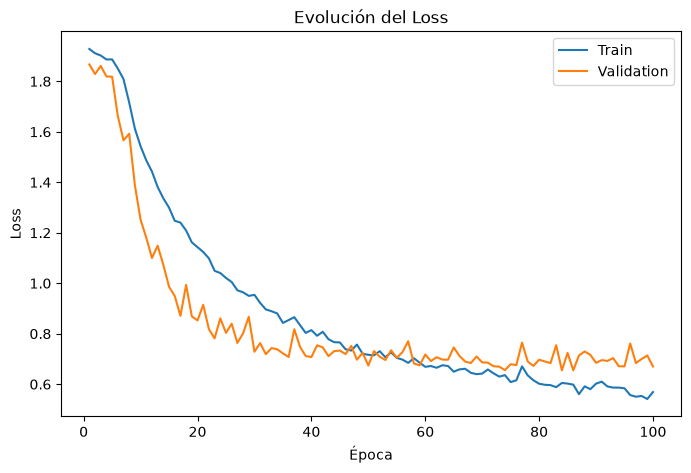

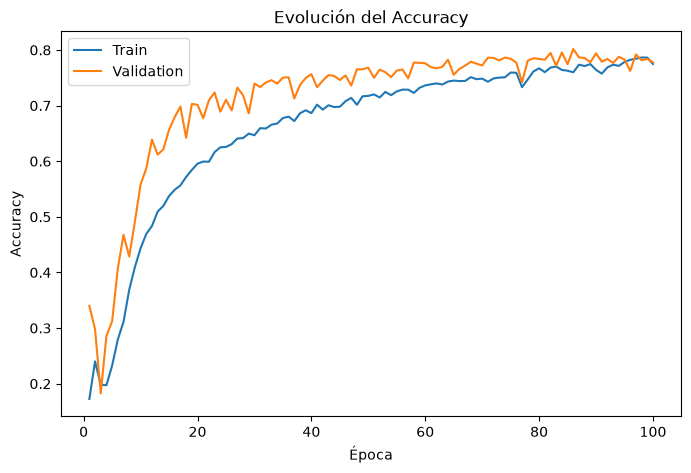

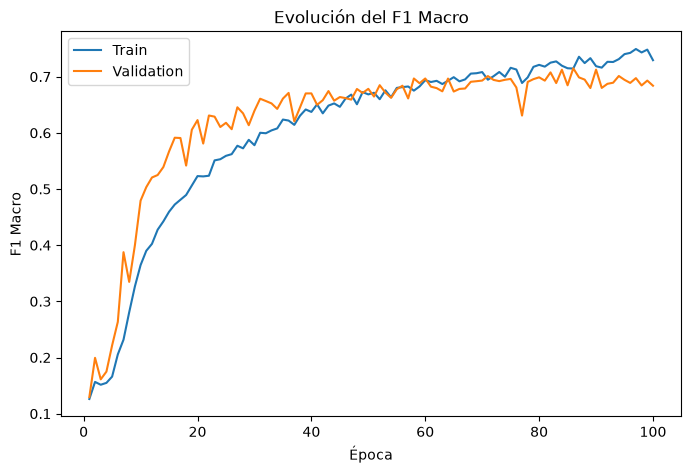

In [13]:
epochs = history["epoch"]

plt.figure(figsize=(8, 5))
plt.plot(
    epochs,
    history["train_loss"],
    label="Train"
)
plt.plot(
    epochs,
    history["val_loss"],
    label="Validation"
)
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("Evolución del Loss")
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(
    epochs,
    history["train_acc"],
    label="Train"
)
plt.plot(
    epochs,
    history["val_acc"],
    label="Validation"
)
plt.xlabel("Época")
plt.ylabel("Accuracy")
plt.title("Evolución del Accuracy")
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(
    epochs,
    history["train_f1"],
    label="Train"
)
plt.plot(
    epochs,
    history["val_f1"],
    label="Validation"
)
plt.xlabel("Época")
plt.ylabel("F1 Macro")
plt.title("Evolución del F1 Macro")
plt.legend()
plt.show()

### 3.2 Classification report

In [14]:
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4
    )
)

              precision    recall  f1-score   support

     alegria     0.9181    0.8802    0.8988      1185
    disgusto     0.4677    0.5437    0.5029       160
       enojo     0.6743    0.7284    0.7003       162
       miedo     0.5753    0.5676    0.5714        74
    seriedad     0.7500    0.8162    0.7817       680
    sorpresa     0.8176    0.7629    0.7893       329
    tristeza     0.7650    0.7218    0.7427       478

    accuracy                         0.7956      3068
   macro avg     0.7097    0.7172    0.7124      3068
weighted avg     0.8016    0.7956    0.7977      3068



### 3.3 Matriz de confusión absoluta

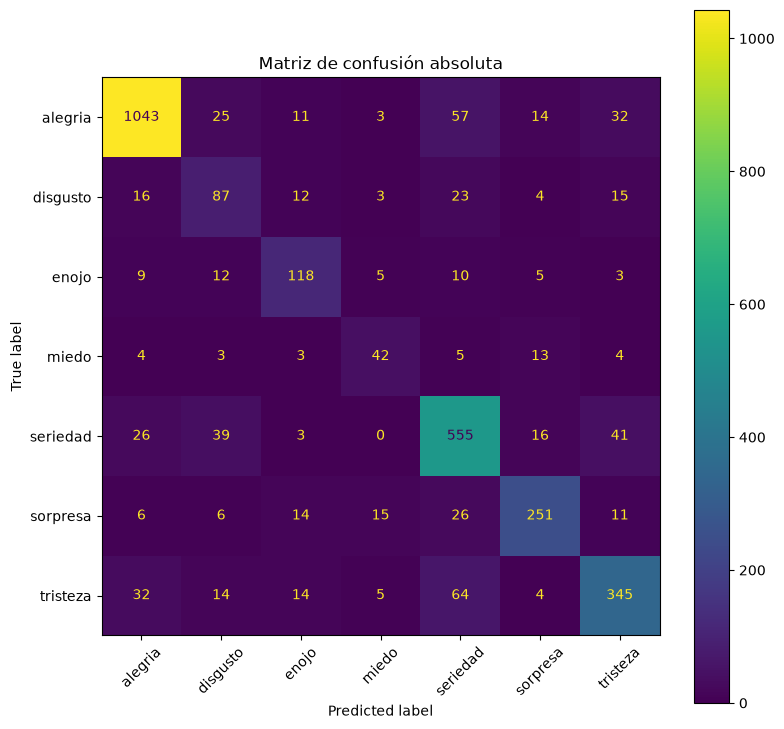

In [ ]:
cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=class_names
)

fig, ax = plt.subplots(figsize=(9, 9))

disp.plot(
    ax=ax,
    xticks_rotation=45,
    values_format="d"
)

plt.title(
    "Matriz de confusión absoluta"
)
plt.show()

### 3.4 Matriz de confusión normalizada

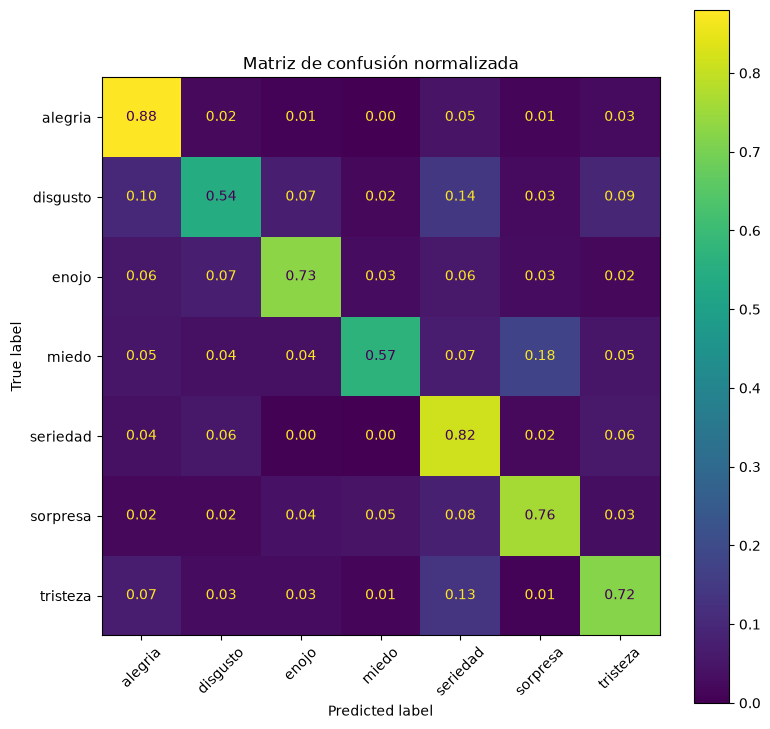

In [ ]:
cm_norm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_norm,
    display_labels=class_names
)

fig, ax = plt.subplots(figsize=(9, 9))

disp.plot(
    ax=ax,
    xticks_rotation=45,
    values_format=".2f"
)

plt.title(
    "Matriz de confusión normalizada"
)
plt.show()

### 3.5 Análisis

Completar después del entrenamiento.

Comparar especialmente:

- Accuracy final.
- F1 Macro.
- Diferencias entre clases.
- Confusiones frecuentes.
- Diferencia entre train y validation.

## 4. Prueba con imágenes nuevas

In [ ]:
IMAGES_DIR = (Path.cwd() / "resources2")

imagenes_nuevas = [
    (IMAGES_DIR / "alegria_1.jpg", "alegria"),
    (IMAGES_DIR / "alegria_2.jpg", "alegria"),

    (IMAGES_DIR / "tristeza_1.jpg", "tristeza"),
    (IMAGES_DIR / "tristeza_2.jpg", "tristeza"),

    (IMAGES_DIR / "enojo_1.jpg", "enojo"),
    (IMAGES_DIR / "enojo_2.jpg", "enojo"),

    (IMAGES_DIR / "miedo.avif", "miedo"),

    (IMAGES_DIR / "sorpresa_1.avif", "sorpresa"),
    (IMAGES_DIR / "sorpresa_2.avif", "sorpresa"),
    (IMAGES_DIR / "sorpresa_3.jpg", "sorpresa"),

    (IMAGES_DIR / "disgusto_1.avif", "disgusto"),
    (IMAGES_DIR / "disgusto_2.jpg", "disgusto"),

    (IMAGES_DIR / "seriedad_1.jpg", "seriedad"),
    (IMAGES_DIR / "seriedad_2.jpg", "seriedad")
]

print("Cantidad:", len(imagenes_nuevas))

faltantes = [
    path.name
    for path, _ in imagenes_nuevas
    if not path.exists()
]

if faltantes:
    print("Archivos faltantes:")
    for nombre in faltantes:
        print(" -", nombre)
else:
    print("Todas las imágenes existen.")

Cantidad: 14
Todas las imágenes existen.


### 4.1 Función de predicción

In [ ]:
def predecir_imagen(model, image_pil
):

    tensor = val_transform(
        image_pil
    )

    batch = (
        tensor
        .unsqueeze(0)
        .to(device)
    )

    model.eval()

    with torch.no_grad():

        logits = model(batch)

        probabilities = (
            torch.softmax(
                logits,
                dim=1
            )[0]
            .cpu()
            .numpy()
        )

    pred_idx = (probabilities.argmax())

    pred_class = (class_names[pred_idx])

    return (tensor.cpu(), probabilities, pred_class)

### 4.2 Resultados sin recorte

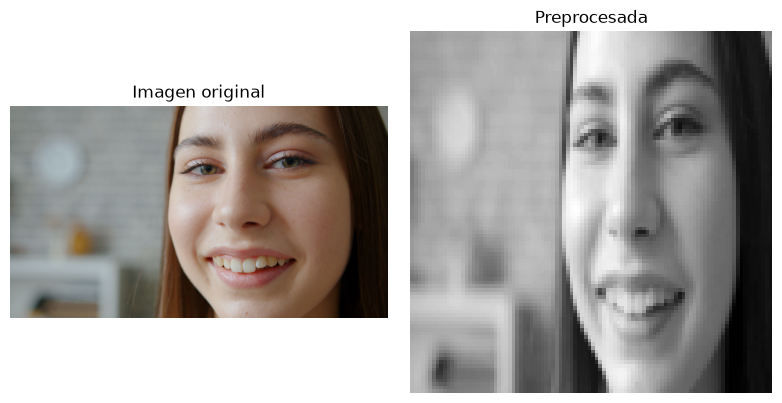

Esperada: alegria
Predicción: alegria


,Score
alegria,0.750836
tristeza,0.166524
disgusto,0.029934
miedo,0.028635
enojo,0.011033
sorpresa,0.006944
seriedad,0.006093


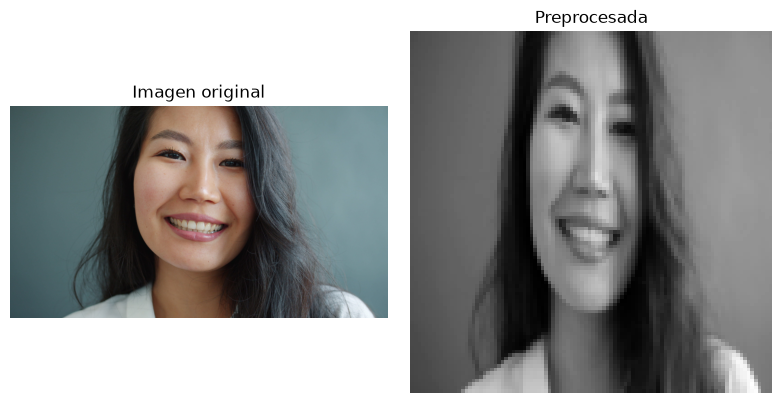

Esperada: alegria
Predicción: enojo


,Score
enojo,0.646721
disgusto,0.182277
tristeza,0.114719
seriedad,0.018268
miedo,0.017962
alegria,0.010279
sorpresa,0.009774


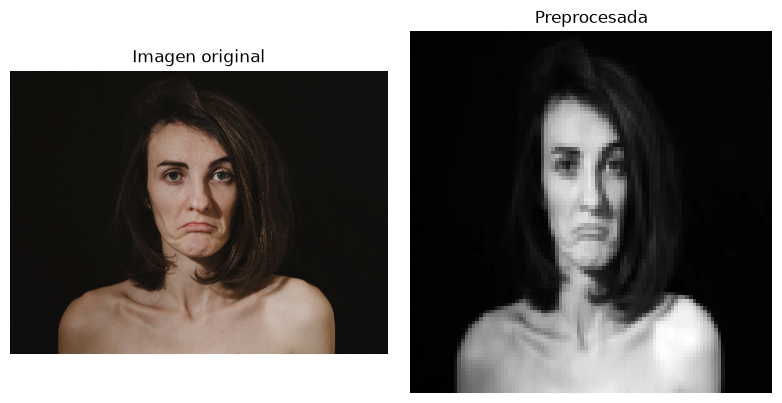

Esperada: tristeza
Predicción: alegria


,Score
alegria,0.370155
sorpresa,0.178681
seriedad,0.160603
tristeza,0.155504
enojo,0.055484
disgusto,0.040827
miedo,0.038746


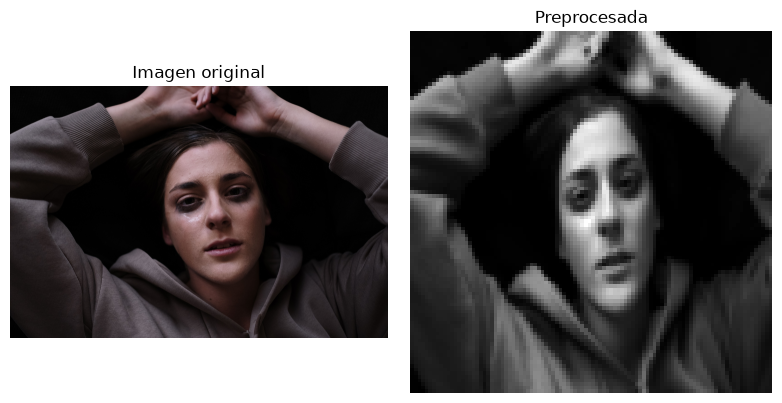

Esperada: tristeza
Predicción: disgusto


,Score
disgusto,0.240725
seriedad,0.169152
enojo,0.147958
sorpresa,0.135953
alegria,0.131512
miedo,0.098048
tristeza,0.076651


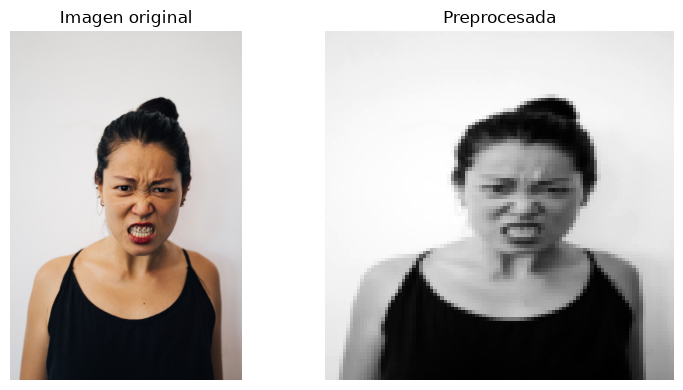

Esperada: enojo
Predicción: enojo


,Score
enojo,0.283249
disgusto,0.190738
alegria,0.144586
tristeza,0.101990
miedo,0.095045
seriedad,0.092539
sorpresa,0.091853


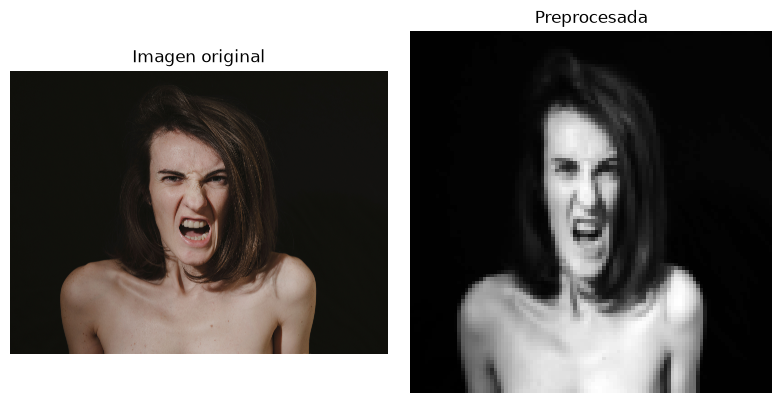

Esperada: enojo
Predicción: sorpresa


,Score
sorpresa,0.234162
seriedad,0.195805
alegria,0.160259
tristeza,0.157161
disgusto,0.102344
enojo,0.078062
miedo,0.072207


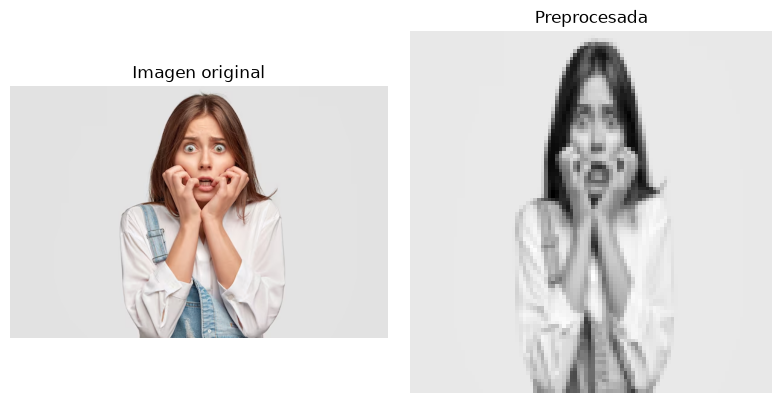

Esperada: miedo
Predicción: disgusto


,Score
disgusto,0.186078
alegria,0.180196
tristeza,0.179086
enojo,0.159443
seriedad,0.130704
sorpresa,0.099625
miedo,0.064869


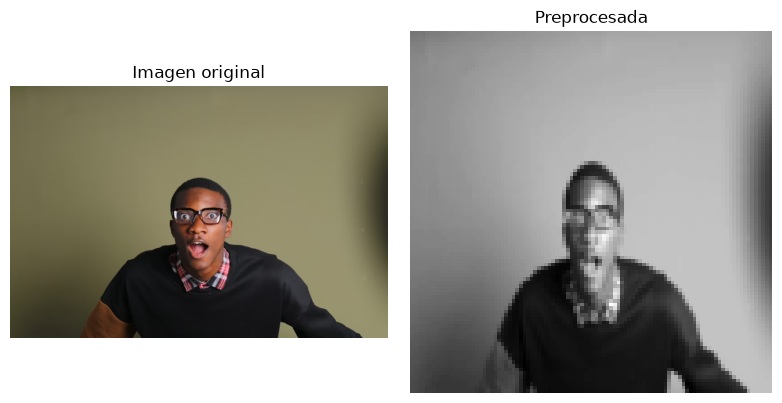

Esperada: sorpresa
Predicción: sorpresa


,Score
sorpresa,0.304391
seriedad,0.227822
enojo,0.147572
disgusto,0.128110
tristeza,0.124949
miedo,0.053534
alegria,0.013622


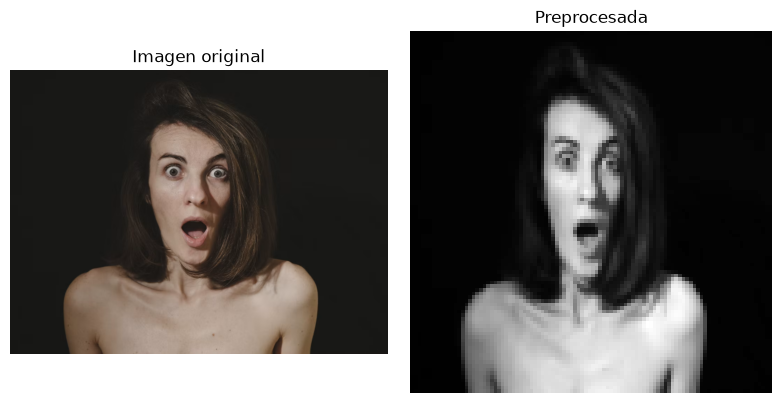

Esperada: sorpresa
Predicción: alegria


,Score
alegria,0.352808
sorpresa,0.255460
seriedad,0.218553
tristeza,0.079635
disgusto,0.050375
enojo,0.027325
miedo,0.015843


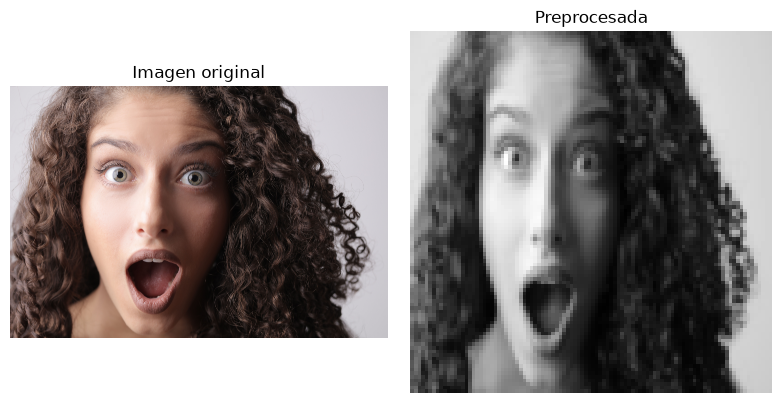

Esperada: sorpresa
Predicción: miedo


,Score
miedo,0.224013
tristeza,0.206124
alegria,0.129564
enojo,0.129005
seriedad,0.125953
sorpresa,0.112360
disgusto,0.072981


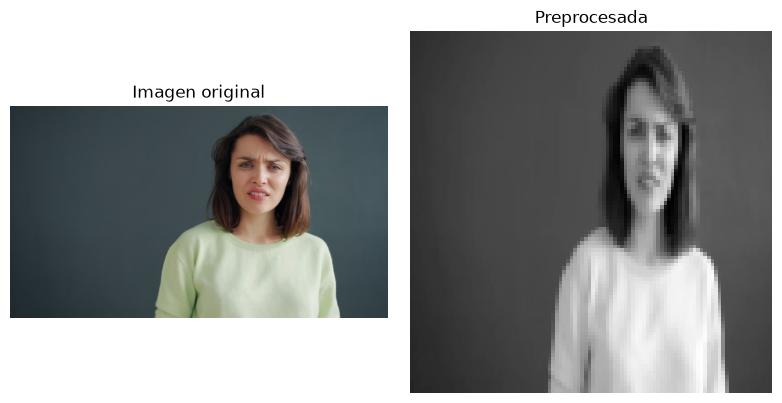

Esperada: disgusto
Predicción: enojo


,Score
enojo,0.267798
sorpresa,0.200709
seriedad,0.151270
tristeza,0.130046
miedo,0.120980
disgusto,0.078842
alegria,0.050356


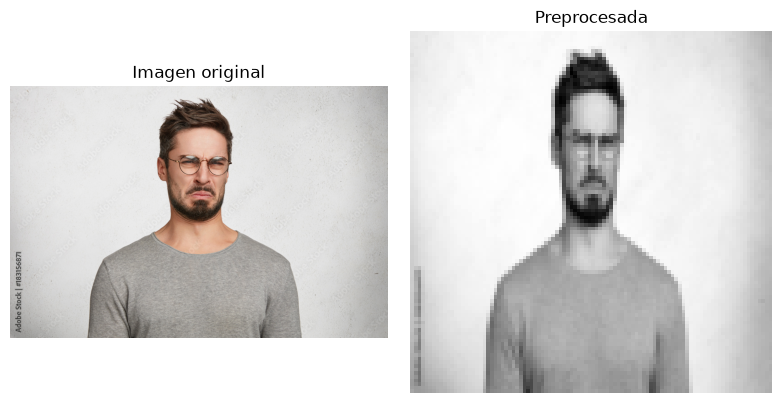

Esperada: disgusto
Predicción: disgusto


,Score
disgusto,0.258559
enojo,0.223735
seriedad,0.204546
sorpresa,0.130269
tristeza,0.113745
alegria,0.037664
miedo,0.031482


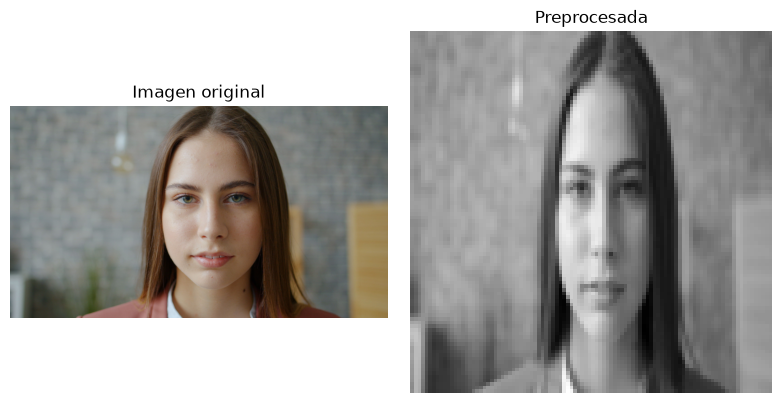

Esperada: seriedad
Predicción: enojo


,Score
enojo,0.338214
tristeza,0.246998
disgusto,0.154454
seriedad,0.085680
miedo,0.072745
sorpresa,0.058144
alegria,0.043765


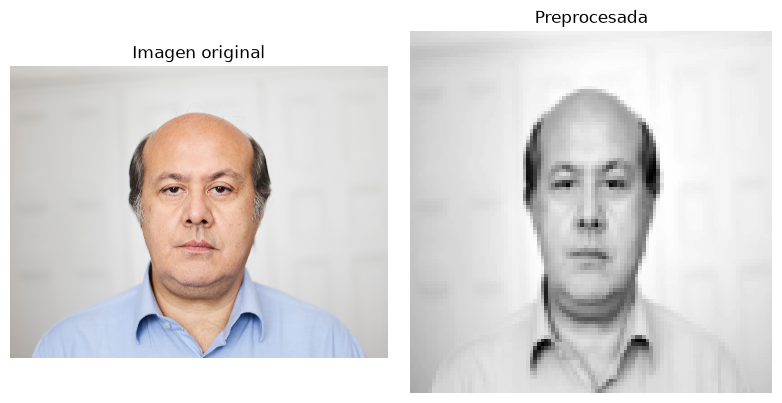

Esperada: seriedad
Predicción: disgusto


,Score
disgusto,0.315929
tristeza,0.191955
seriedad,0.173725
enojo,0.145436
sorpresa,0.115259
alegria,0.030784
miedo,0.026913


In [49]:
resultados_sin_recorte = []

for image_path, expected_class in imagenes_nuevas:

    if not image_path.exists():
        continue

    image = Image.open(
        image_path
    ).convert("RGB")

    (
        processed,
        probabilities,
        predicted_class
    ) = predecir_imagen(
        model,
        image
    )

    fig, ax = plt.subplots(
        1, 2,
        figsize=(8, 4)
    )

    ax[0].imshow(image)
    ax[0].set_title(
        "Imagen original"
    )
    ax[0].axis("off")

    ax[1].imshow(
        processed.squeeze().numpy(),
        cmap="gray"
    )
    ax[1].set_title(
        "Preprocesada"
    )
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

    scores = pd.Series(
        probabilities,
        index=class_names
    ).sort_values(
        ascending=False
    )

    print(
        "Esperada:",
        expected_class
    )
    print(
        "Predicción:",
        predicted_class
    )

    display(
        scores.to_frame("Score")
    )

    resultados_sin_recorte.append({
        "imagen": image_path.name,
        "esperada": expected_class,
        "sin_recorte":
            predicted_class,
        "correcta_sin_recorte":
            predicted_class
            == expected_class
    })

In [50]:
df_sin_recorte = pd.DataFrame(
    resultados_sin_recorte
)

display(df_sin_recorte)

if len(df_sin_recorte):

    correctas = (
        df_sin_recorte[
            "correcta_sin_recorte"
        ].sum()
    )

    print(
        f"Correctas sin recorte: "
        f"{correctas}/"
        f"{len(df_sin_recorte)}"
    )

,imagen,esperada,sin_recorte,correcta_sin_recorte
0,alegria_1.jpg,alegria,alegria,True
1,alegria_2.jpg,alegria,enojo,False
2,tristeza_1.jpg,tristeza,alegria,False
3,tristeza_2.jpg,tristeza,disgusto,False
4,enojo_1.jpg,enojo,enojo,True
5,enojo_2.jpg,enojo,sorpresa,False
6,miedo.avif,miedo,disgusto,False
7,sorpresa_1.avif,sorpresa,sorpresa,True
8,sorpresa_2.avif,sorpresa,alegria,False
9,sorpresa_3.jpg,sorpresa,miedo,False


Correctas sin recorte: 4/14


### 4.3 Conclusiones preliminares

Completar después de ejecutar.

Es esperable que las imágenes completas tengan peor rendimiento si el rostro ocupa una porción pequeña de la imagen, ya que el dataset de entrenamiento contiene principalmente rostros recortados.

## 5. Prueba con detección y recorte facial

Para aproximar las imágenes externas al dominio de entrenamiento, se detecta el rostro y se genera un recorte **cuadrado** centrado en la cara.

La imagen se carga con PIL para soportar también formatos como AVIF; OpenCV se utiliza solamente para la detección.

In [ ]:
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades
    + "haarcascade_frontalface_default.xml"
)


def detectar_y_recortar_rostro(
    image_path,
    scale_factor=1.1,
    min_neighbors=3,
    min_size=(30, 30)
):

    # PIL soporta más formatos
    pil_image = Image.open(image_path).convert("RGB")

    image_rgb = np.array(pil_image)

    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)

    faces = (face_cascade.detectMultiScale(
            gray,
            scaleFactor=scale_factor,
            minNeighbors=min_neighbors,
            minSize=min_size
        )
    )

    image_with_box = (image_rgb.copy())

    if len(faces) == 0:
        return (image_rgb, image_with_box, None)

    # Elegir la detección de mayor área
    x, y, w, h = max(faces, key=lambda box:
            box[2] * box[3]
    )

    cv2.rectangle(
        image_with_box,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        2
    )

    # Recorte cuadrado
    center_x = x + w // 2
    center_y = y + h // 2

    side = max(w, h)
    half_side = side // 2

    x1 = max(center_x - half_side, 0)

    y1 = max(center_y - half_side, 0)

    x2 = min(center_x + half_side, image_rgb.shape[1])

    y2 = min(center_y + half_side, image_rgb.shape[0])

    cropped = image_rgb[y1:y2, x1:x2]
    
    return (
        image_rgb,
        image_with_box,
        cropped
    )

### 5.1 Resultados con recorte

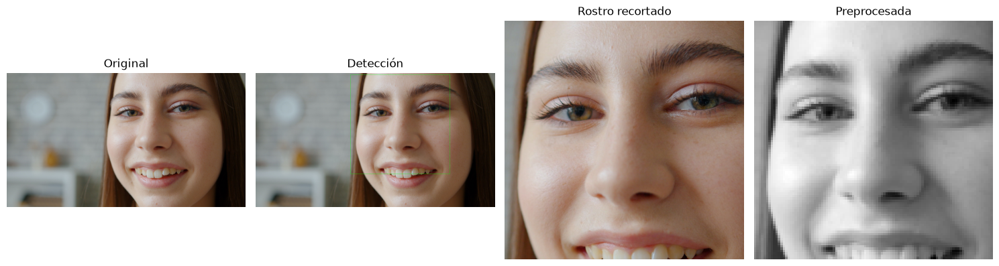

Esperada: alegria
Predicción: alegria


,Score
alegria,0.900940
tristeza,0.057553
disgusto,0.029299
seriedad,0.007197
miedo,0.003553
enojo,0.001238
sorpresa,0.000219


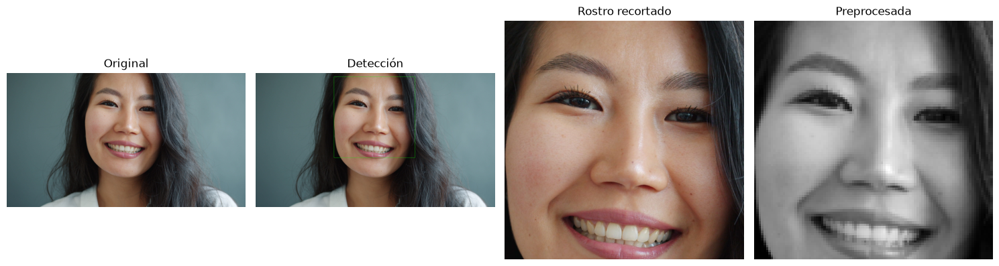

Esperada: alegria
Predicción: alegria


,Score
alegria,9.987260e-01
tristeza,1.214318e-03
disgusto,3.030247e-05
miedo,2.484501e-05
seriedad,4.105520e-06
sorpresa,5.616884e-07
enojo,2.994877e-09


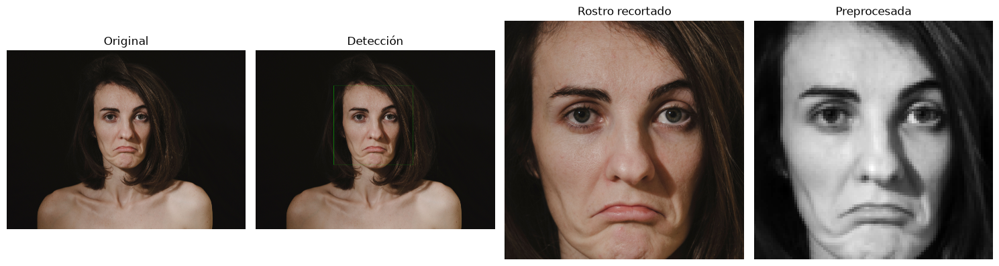

Esperada: tristeza
Predicción: tristeza


,Score
tristeza,0.902758
seriedad,0.073014
sorpresa,0.016950
miedo,0.004799
disgusto,0.001498
alegria,0.000678
enojo,0.000303


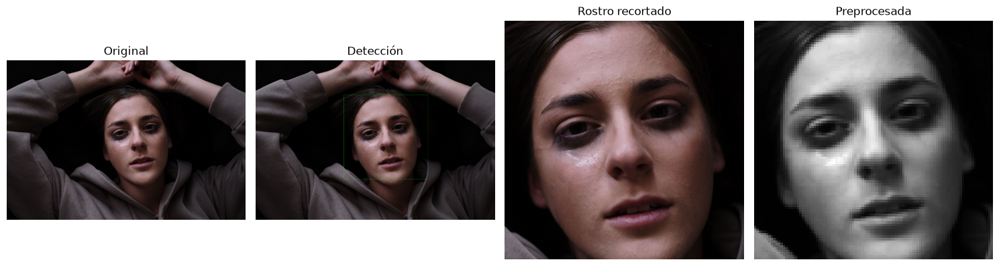

Esperada: tristeza
Predicción: tristeza


,Score
tristeza,0.563026
seriedad,0.411376
sorpresa,0.012110
alegria,0.004920
disgusto,0.004230
miedo,0.003726
enojo,0.000611


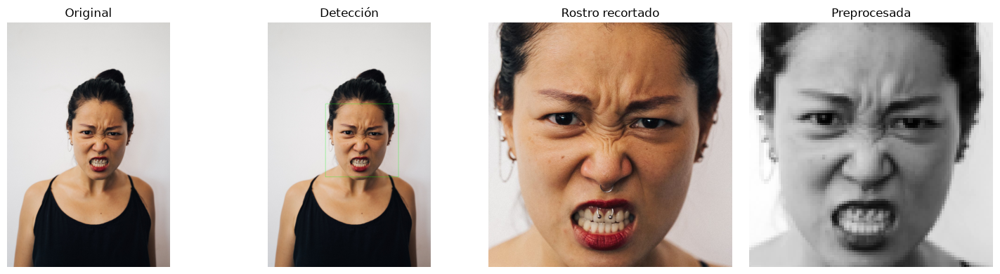

Esperada: enojo
Predicción: enojo


,Score
enojo,0.987670
disgusto,0.011776
tristeza,0.000304
sorpresa,0.000185
seriedad,0.000048
alegria,0.000011
miedo,0.000005


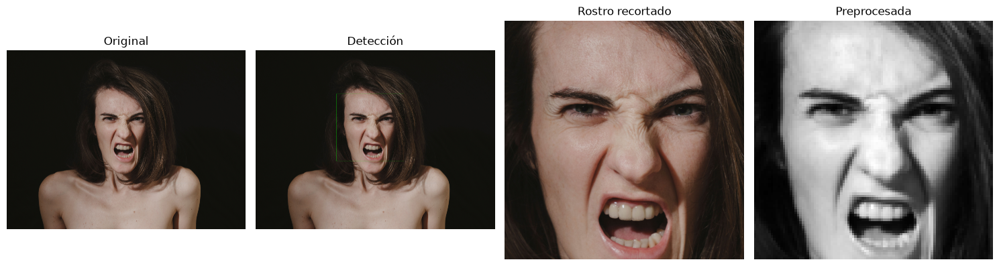

Esperada: enojo
Predicción: enojo


,Score
enojo,9.990068e-01
disgusto,5.878833e-04
miedo,3.986153e-04
sorpresa,4.723212e-06
alegria,1.261997e-06
tristeza,6.714770e-07
seriedad,5.430326e-08


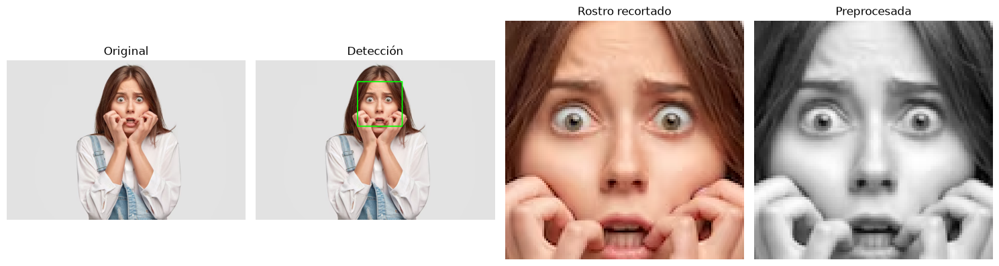

Esperada: miedo
Predicción: miedo


,Score
miedo,5.510668e-01
sorpresa,4.489320e-01
alegria,1.160331e-06
enojo,1.050075e-07
disgusto,3.609073e-08
tristeza,1.535982e-09
seriedad,1.373499e-09


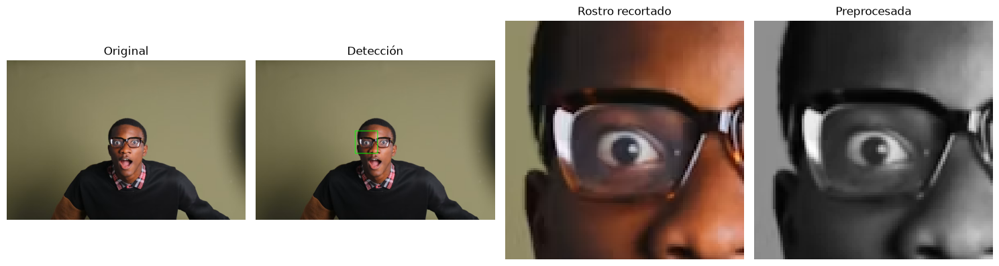

Esperada: sorpresa
Predicción: sorpresa


,Score
sorpresa,0.403210
seriedad,0.321441
disgusto,0.070403
enojo,0.066288
miedo,0.055539
alegria,0.055253
tristeza,0.027867


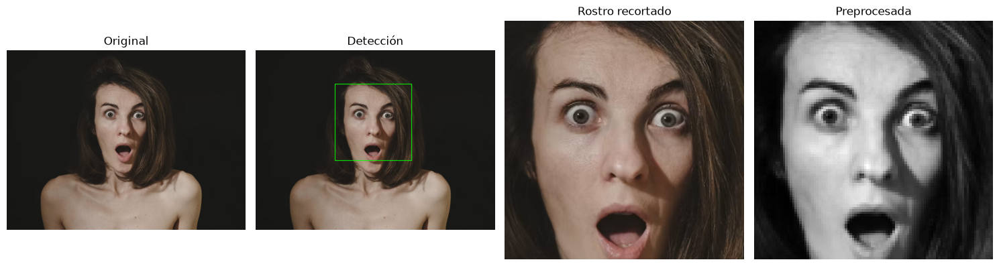

Esperada: sorpresa
Predicción: sorpresa


,Score
sorpresa,0.918855
miedo,0.080957
enojo,0.000088
alegria,0.000035
tristeza,0.000030
seriedad,0.000025
disgusto,0.000010


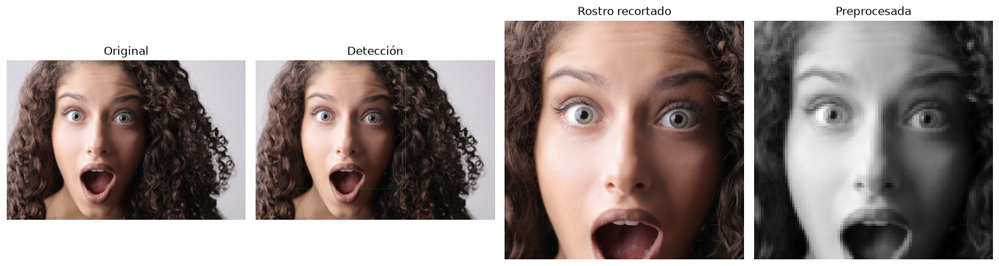

Esperada: sorpresa
Predicción: sorpresa


,Score
sorpresa,7.768262e-01
miedo,2.229212e-01
alegria,2.411394e-04
tristeza,4.201044e-06
enojo,3.599967e-06
seriedad,3.193631e-06
disgusto,4.816504e-07


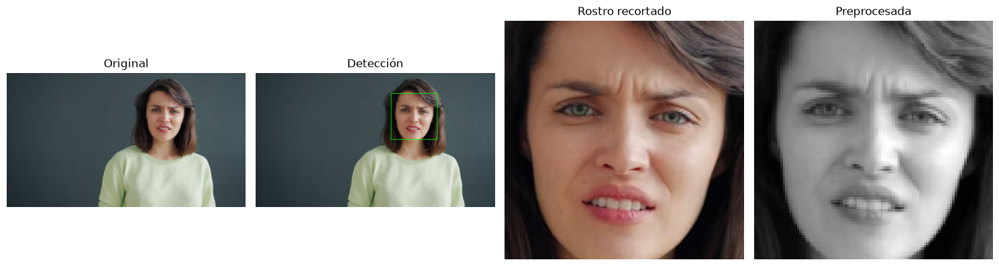

Esperada: disgusto
Predicción: tristeza


,Score
tristeza,0.448991
disgusto,0.346577
miedo,0.126495
alegria,0.059969
seriedad,0.009136
enojo,0.008293
sorpresa,0.000539


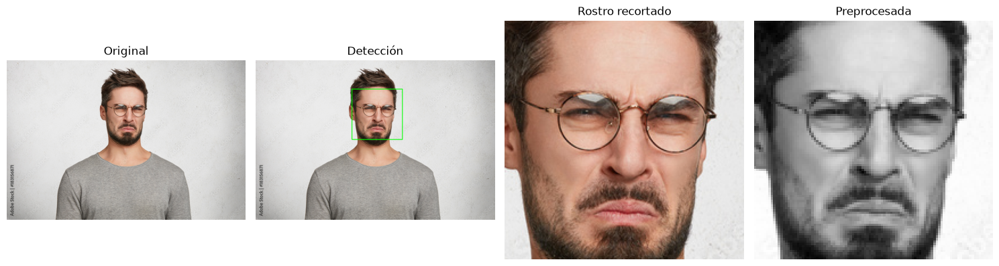

Esperada: disgusto
Predicción: disgusto


,Score
disgusto,0.961282
enojo,0.017569
tristeza,0.012346
seriedad,0.006326
sorpresa,0.001570
alegria,0.000709
miedo,0.000198


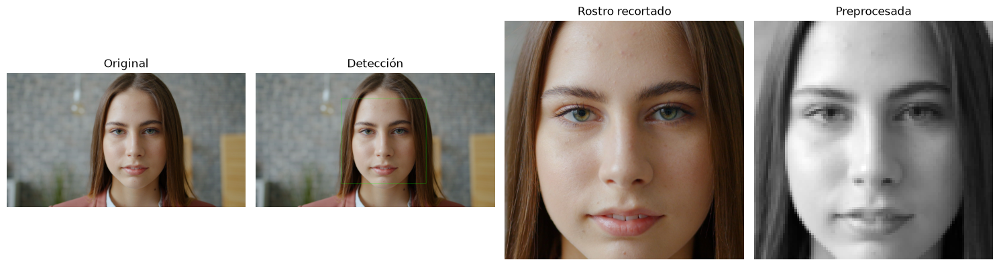

Esperada: seriedad
Predicción: seriedad


,Score
seriedad,0.393656
alegria,0.343473
tristeza,0.262537
disgusto,0.000263
sorpresa,0.000054
miedo,0.000015
enojo,0.000001


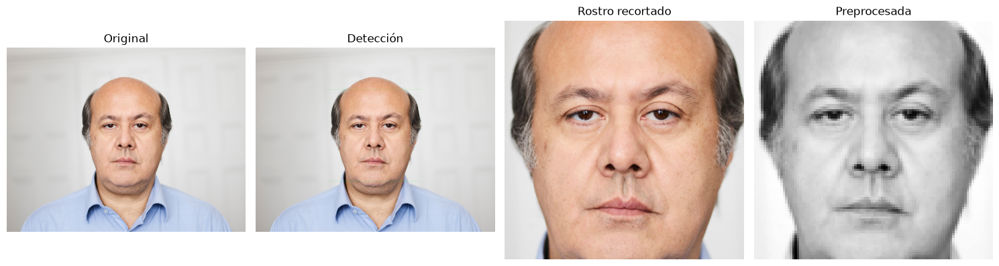

Esperada: seriedad
Predicción: seriedad


,Score
seriedad,0.477366
tristeza,0.467606
alegria,0.038636
disgusto,0.015878
enojo,0.000379
sorpresa,0.000124
miedo,0.000010


In [ ]:
resultados_con_recorte = []

for image_path, expected_class in imagenes_nuevas:

    if not image_path.exists():
        continue

    (
        original,
        detected,
        cropped
    ) = detectar_y_recortar_rostro(
        image_path
    )

    if cropped is None:

        print("No se detectó rostro:", image_path.name)

        resultados_con_recorte.append({
            "imagen": image_path.name,
            "con_recorte":
                "No detectado",
            "correcta_con_recorte":
                False
        })

        continue

    cropped_pil = Image.fromarray(cropped)

    (
        processed,
        probabilities,
        predicted_class
    ) = predecir_imagen(
        model,
        cropped_pil
    )

    fig, ax = plt.subplots(1, 4, figsize=(15, 4))

    ax[0].imshow(original)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(detected)
    ax[1].set_title("Detección")
    ax[1].axis("off")

    ax[2].imshow(cropped)
    ax[2].set_title("Rostro recortado")
    ax[2].axis("off")

    ax[3].imshow(processed.squeeze().numpy(), cmap="gray")
    ax[3].set_title("Preprocesada")
    ax[3].axis("off")

    plt.tight_layout()
    plt.show()

    scores = pd.Series(probabilities, index=class_names
    ).sort_values(
        ascending=False
    )

    print("Esperada:", expected_class)
    print("Predicción:", predicted_class)

    display(scores.to_frame("Score"))

    resultados_con_recorte.append({
        "imagen": image_path.name,
        "con_recorte":
            predicted_class,
        "correcta_con_recorte":
            predicted_class
            == expected_class
    })

### 5.2 Comparación final

In [ ]:
df_con_recorte = pd.DataFrame(
    resultados_con_recorte
)

df_comparacion = (
    df_sin_recorte.merge(
        df_con_recorte,
        on="imagen",
        how="left"
    )
)

display(df_comparacion)

if len(df_comparacion):

    correctas_sin = (
        df_comparacion["correcta_sin_recorte"].sum()
    )

    correctas_con = (
        df_comparacion[
            "correcta_con_recorte"
        ]
        .fillna(False)
        .sum()
    )

    print(
        f"Correctas sin recorte: "
        f"{correctas_sin}/"
        f"{len(df_comparacion)}"
    )

    print(
        f"Correctas con recorte: "
        f"{correctas_con}/"
        f"{len(df_comparacion)}"
    )

,imagen,esperada,sin_recorte,correcta_sin_recorte,con_recorte,correcta_con_recorte
0,alegria_1.jpg,alegria,alegria,True,alegria,True
1,alegria_2.jpg,alegria,enojo,False,alegria,True
2,tristeza_1.jpg,tristeza,alegria,False,tristeza,True
3,tristeza_2.jpg,tristeza,disgusto,False,tristeza,True
4,enojo_1.jpg,enojo,enojo,True,enojo,True
5,enojo_2.jpg,enojo,sorpresa,False,enojo,True
6,miedo.avif,miedo,disgusto,False,miedo,True
7,sorpresa_1.avif,sorpresa,sorpresa,True,sorpresa,True
8,sorpresa_2.avif,sorpresa,alegria,False,sorpresa,True
9,sorpresa_3.jpg,sorpresa,miedo,False,sorpresa,True


Correctas sin recorte: 4/14
Correctas con recorte: 13/14


### 5.3 Conclusiones finales

